In [1]:
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True)

Random Seed:  999


In [2]:
DATASET = "MNIST"

# Root directory for dataset
dataroot = "./data"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3 if DATASET == "CIFAR10" else 1

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 20

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [3]:
if DATASET == 'MNIST':
    transform = transforms.Compose([
                                 transforms.Resize(image_size),
                                 transforms.CenterCrop(image_size),
                                 transforms.ToTensor(),
                                 transforms.Normalize((0.5,), (0.5,)),
                            ])
    trainset = dset.MNIST(root=dataroot, train=True, download=True, transform=transform)
    testset = dset.MNIST(root=dataroot, train=False, download=True, transform=transform)
    classes = ('0', '1', '2', '3', '4', '5', '6', '7', '8', '9')
elif DATASET == 'CIFAR10':
    transform = transforms.Compose([
                                 transforms.Resize(image_size),
                                 transforms.CenterCrop(image_size),
                                 transforms.ToTensor(),
                                 transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                            ])
    trainset = dset.CIFAR10(root=dataroot, train=True, download=True, transform=transform)
    testset = dset.CIFAR10(root=dataroot, train=False, download=True, transform=transform)
    classes = ('plane', 'car', 'bird', 'cat',
            'deer', 'dog', 'frog', 'horse', 'ship', 'truck')
elif DATASET == 'FashionMNIST':
    transform = transforms.Compose([
                                 transforms.Resize(image_size),
                                 transforms.CenterCrop(image_size),
                                 transforms.ToTensor(),
                                 transforms.Normalize((0.5,), (0.5,)),
                            ])
    trainset = dset.FashionMNIST(root=dataroot, train=True, download=True, transform=transform)
    testset = dset.FashionMNIST(root=dataroot, train=False, download=True, transform=transform)
    classes = ('plane', 'car', 'bird', 'cat',
            'deer', 'dog', 'frog', 'horse', 'ship', 'truck')
    
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers = workers) # , num_workers=2
testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size, shuffle=False, num_workers = workers) # , num_workers=2

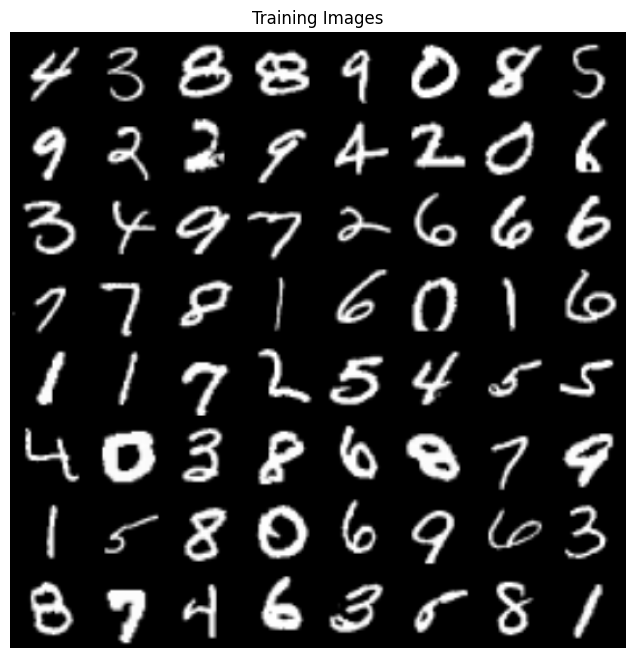

In [4]:
# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(trainloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

In [5]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [6]:
# Generator code

class Generator(nn.Module):
    def __init__(self, ngpu) -> None:
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(nz, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )
    def forward(self, input):
        return self.main(input)

In [7]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [8]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) * 64 * 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias = False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) * 32 * 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias = False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf * 2) * 16 * 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias = False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf * 4) * 8 * 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias = False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf * 8) * 4 * 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias = False),
            nn.Sigmoid()
        )
    def forward(self, input):
        return self.main(input)

In [9]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu) > 1:
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weight
# like this: to mean=0, stdev=0.2

netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [10]:
# Initialize the BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
# the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [11]:
print(device)

cuda:0


In [12]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting trainin Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(trainloader, 0):

        ##########################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(x)))
        ##########################
        ## train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size, ), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake image batch with G
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real - errD_fake
        # Update D
        optimizerD.step()

        ##########################
        # (2) Update G network: maximize log(D(G(z)))
        ##########################
        netG.zero_grad()
        label.fill_(real_label) # faje labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print(f'[{epoch}/{num_epochs}][{i}/{len(trainloader)}] \t Loss_D: {errD.item()} \t Loss_G: {errG.item()} \t D(x): {D_x} \t D(G(X)): {D_G_z1}/{D_G_z2}')
        # Save losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(trainloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1
        

Starting trainin Loop...
[0/20][0/469] 	 Loss_D: -0.7747632265090942 	 Loss_G: 3.6853115558624268 	 D(x): 0.49440521001815796 	 D(G(X)): 0.7285659313201904/0.04185107350349426
[0/20][50/469] 	 Loss_D: -0.4325885474681854 	 Loss_G: 18.729900360107422 	 D(x): 0.9791781902313232 	 D(G(X)): 0.3346031904220581/1.2446685460076878e-08
[0/20][100/469] 	 Loss_D: -0.032183632254600525 	 Loss_G: 9.954025268554688 	 D(x): 0.9930218458175659 	 D(G(X)): 0.038315460085868835/5.5343036365229636e-05
[0/20][150/469] 	 Loss_D: 0.05048322305083275 	 Loss_G: 4.295434951782227 	 D(x): 0.922805666923523 	 D(G(X)): 0.04155892878770828/0.01798042468726635
[0/20][200/469] 	 Loss_D: 0.09253542870283127 	 Loss_G: 2.9626805782318115 	 D(x): 0.8894767761230469 	 D(G(X)): 0.060596171766519547/0.06521742045879364
[0/20][250/469] 	 Loss_D: 0.2062004804611206 	 Loss_G: 2.8216910362243652 	 D(x): 0.797886312007904 	 D(G(X)): 0.0631803348660469/0.08694449067115784
[0/20][300/469] 	 Loss_D: 0.022865794599056244 	 Loss_G: 

In [13]:
len(fixed_noise)

64

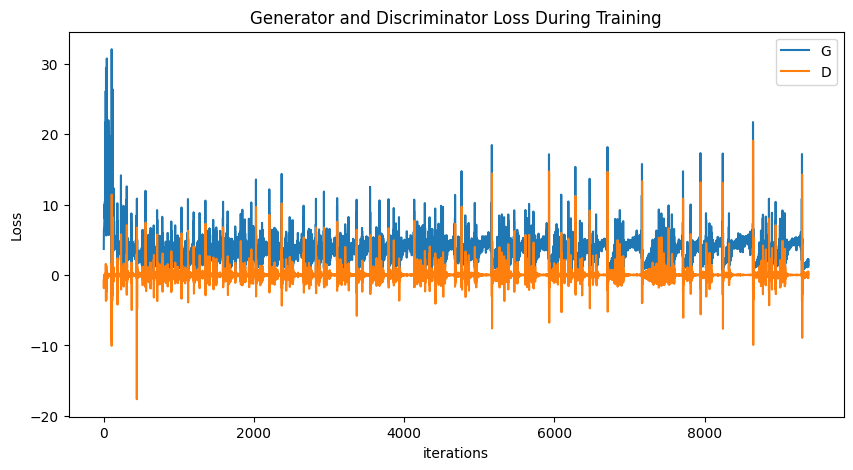

In [14]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses, label="G")
plt.plot(D_losses, label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

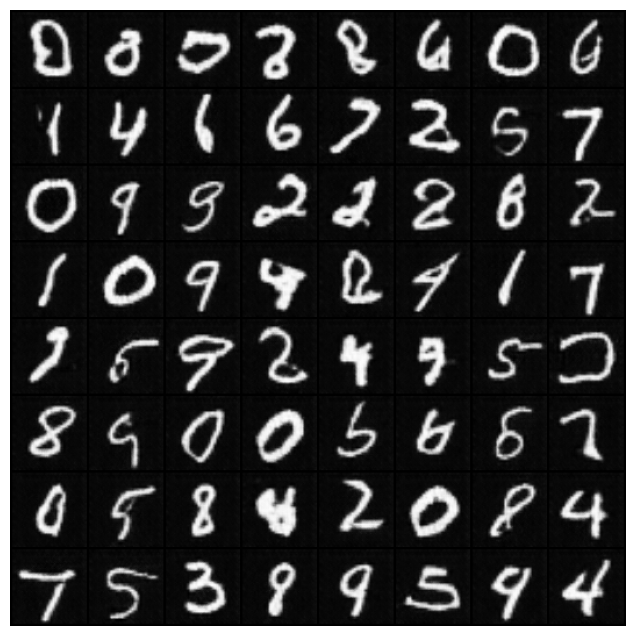

In [15]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

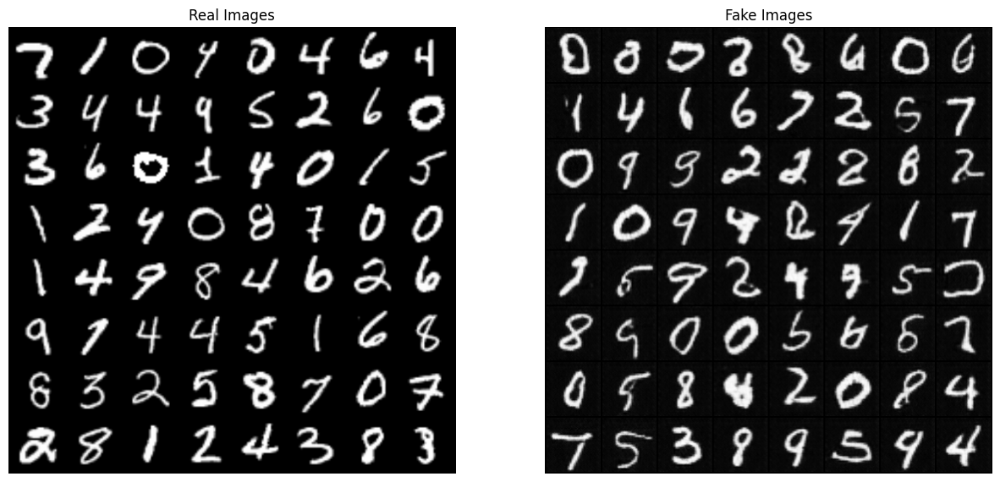

In [16]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(trainloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(), (1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1], (1,2,0)))
plt.show()

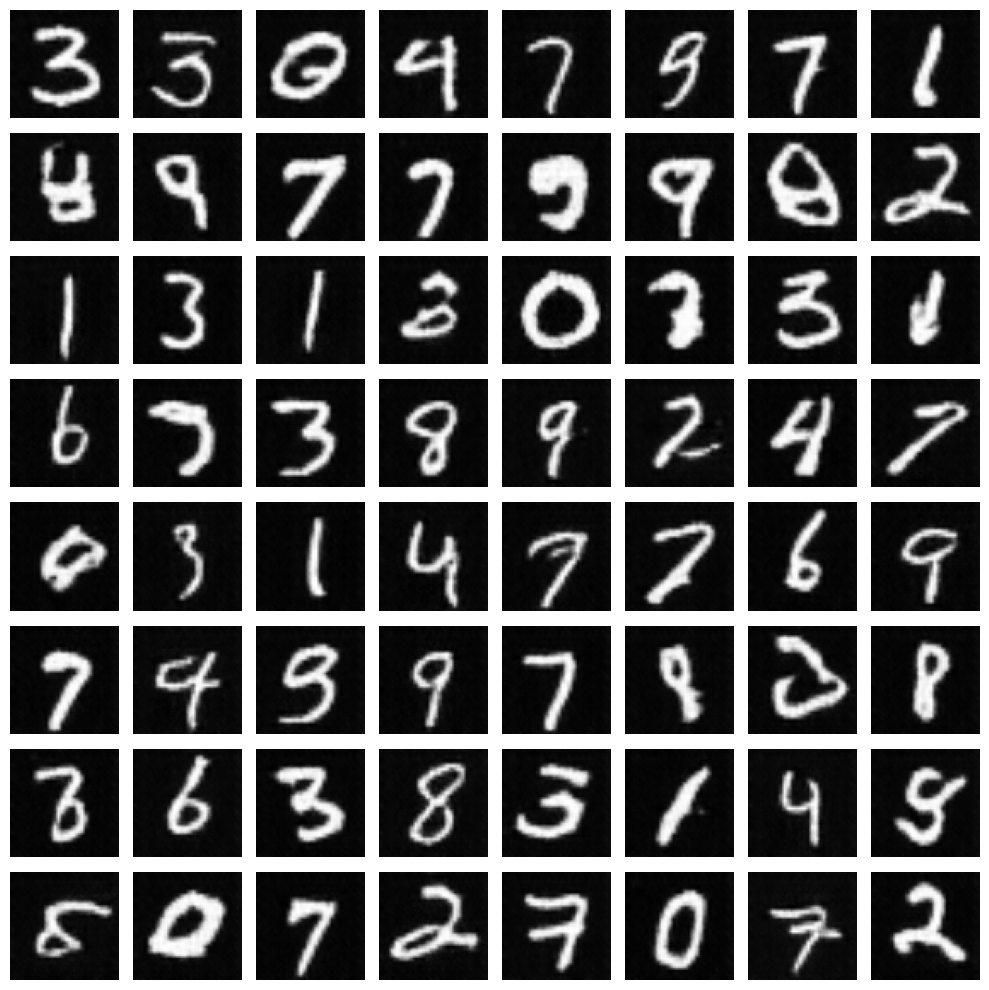

In [111]:
import numpy as np
import matplotlib.pyplot as plt
import torch

# Assuming 'netG' is your trained generator and 'device' is properly set ('cuda' or 'cpu')
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def generate_images(generator, noise_dim, num_images=10):
    # Generate random noise vectors and repeat it for the number of images
    noise_ = torch.randn(num_images, noise_dim, 1, 1, device=device)  # Adjust for device and repeat along batch size
    generator.eval()  # Set generator to evaluation mode
    with torch.no_grad():
        fake_images = generator(noise_)
    
    return fake_images

# Generate images
num_images = 2000
noise_dim = 100  # Change this according to your DCGAN's noise dimension
generated_images = generate_images(netG, noise_dim, num_images)

# Visualize the images
def plot_generated_images(images, nrows, ncols):
    fig, axes = plt.subplots(nrows, ncols, figsize=(10, 10))
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            ax.imshow(images[i].cpu().numpy().transpose(1, 2, 0).squeeze(), cmap='gray')
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Assuming you want to display a grid of images
plot_generated_images(generated_images, nrows=8, ncols=8)  # Matching grid size for 64 images


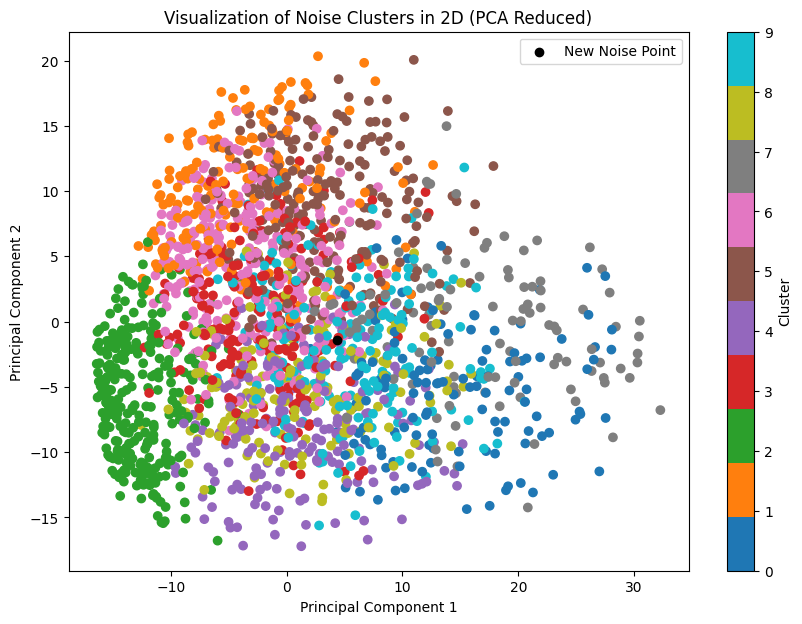

In [119]:
import torch
from sklearn.cluster import KMeans
from sklearn.neighbors import KDTree
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Generate the images (you've already done this)
# Assuming generated_images has shape (num_images, channels, height, width)

# Step 2: Flatten the generated images to shape (num_images, channels * height * width)
num_images, channels, height, width = generated_images.shape
noise_flattened = generated_images.view(num_images, -1).cpu().numpy()  # Flattening each image

# Step 3: Apply k-means clustering to classify into 10 groups
kmeans = KMeans(n_clusters=10, random_state=0)
kmeans.fit(noise_flattened)

# Step 4: Assign clusters to each noise point
labels = kmeans.labels_  # This contains the class (0-9) for each noise

# Step 5: Build a KDTree for efficient search of nearest neighbors (optional)
tree = KDTree(noise_flattened)

# Step 6: Dimensionality Reduction using PCA to 2D for visualization
pca = PCA(n_components=2)
noise_pca = pca.fit_transform(noise_flattened)

# Step 7: Plot the noise data points with their respective cluster labels
plt.figure(figsize=(10, 7))
scatter = plt.scatter(noise_pca[:, 0], noise_pca[:, 1], c=labels, cmap='tab10')
plt.title('Visualization of Noise Clusters in 2D (PCA Reduced)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(scatter, label='Cluster')

# Step 8 (Optional): Plot a new noise point
new_noise = torch.randn(1, noise_dim, 1, 1, device=device)  # New noise point
netG.eval()
with torch.no_grad():
    new_generated_image = netG(new_noise)
new_generated_image_ = new_generated_image.view(1, -1).cpu().numpy()  # Flatten the new image
new_noise_pca = pca.transform(new_generated_image_)  # Project new image to PCA space

# Add the new noise point to the plot
plt.scatter(new_noise_pca[:, 0], new_noise_pca[:, 1], color='black', label='New Noise Point')
plt.legend()

plt.show()


Shape of the approximated image vector: (1, 4096)


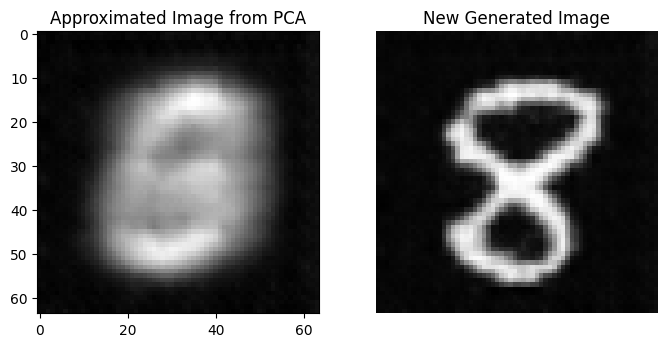

In [125]:
import torch
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Assuming PCA has already been fitted on your noise data and new_noise_pca contains the reduced data
# Step 1: Take a 2D point from PCA space (e.g., pick an arbitrary point)
pca_point = new_noise_pca[0]  # Example: taking the first point from PCA space

# Step 2: Inverse PCA to get back to the high-dimensional space (approximated noise vector)
approx_original_image = pca.inverse_transform([pca_point])

print("Shape of the approximated image vector:", approx_original_image.shape)  # Should be (1, flattened_image_size)

# Step 3: Reshape the flattened vector back to the original image dimensions
num_images, channels, height, width = generated_images.shape  # Original shape of images
flattened_image_size = channels * height * width

# Make sure the reshaped vector matches the original image dimensions
if approx_original_image.shape[1] == flattened_image_size:
    generated_image_np = approx_original_image.reshape(channels, height, width)  # Reshape to original dimensions
else:
    raise ValueError(f"Expected {flattened_image_size} dimensions but got {approx_original_image.shape[1]}")

# Step 4: Visualize the generated image
plt.figure(figsize=(8, 4))

if channels == 1:  # Grayscale image
    generated_image_np = generated_image_np.squeeze(0)  # Remove the channel dimension for grayscale images
    plt.subplot(1, 2, 1)
    plt.title("Approximated Image from PCA")
    plt.imshow(generated_image_np, cmap='gray')

    plt.subplot(1, 2, 2)
    plt.title("New Generated Image")
    plt.imshow(new_generated_image.cpu().numpy().squeeze(), cmap='gray')
    
else:  # RGB image
    generated_image_np = generated_image_np.transpose(1, 2, 0)  # Transpose for RGB (height, width, 3)
    plt.subplot(1, 2, 1)
    plt.title("Approximated Image from PCA")
    plt.imshow(generated_image_np)

    plt.subplot(1, 2, 2)
    plt.title("New Generated Image")
    plt.imshow(new_generated_image.cpu().numpy().transpose(1, 2, 0))

plt.axis('off')
plt.show()
